<a href="https://colab.research.google.com/github/krislars/modphys/blob/master/Mixed_State.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A Mixed State Is A Nonstationary State

Consider a particle in an infinite square well that is in an equal mixture of the first two energy state solutions:

$$
\Psi(x,t) = \frac{1}{\sqrt{2}}\psi_1(x) e^{-i\frac{E_1}{\hbar} t} + \frac{1}{\sqrt{2}}\psi_2(x)  e^{-i\frac{E_2}{\hbar} t}
$$


In [ ]:
from math import *
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation as animation
from matplotlib import rc
rc('animation', html='jshtml')

We will let $L = 1$ here.  Start by plotting the wavefunctions at $t=0$.

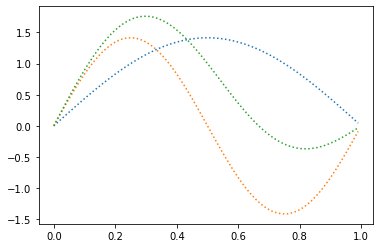

In [ ]:
x = np.arange(0, 1.0, 0.01) # Let L = 1 for this problem.

psi1=np.sqrt(2)*np.sin(np.pi*x)
psi2=np.sqrt(2)*np.sin(2*np.pi*x)

plt.plot(x,psi1,linestyle='dotted')
plt.plot(x,psi2,linestyle='dotted')
plt.plot(x,(psi1+psi2)/np.sqrt(2),linestyle='dotted')

Next, show that the probability density is

$$
\Psi^*\Psi = \frac{1}{2}\psi_1^2 + \frac{1}{2}\psi_2^2 + \psi_1\psi_2 \cos\left(\tfrac{\Delta E}{\hbar}t \right)
$$

Let's plot it, starting at $t=0$.

In [ ]:
psi_star_psi=0.5*(psi1)**2 + 0.5*(psi2)**2 + psi1*psi2*cos(0)

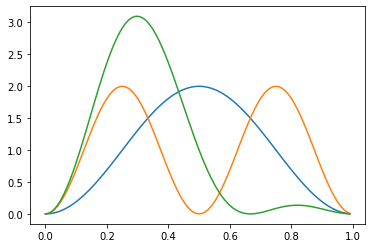

In [ ]:
plt.plot(x,psi1**2)
plt.plot(x,psi2**2)
plt.plot(x,psi_star_psi)

A-ha!  What's going on is that in the first part of the well, the wavefunctions add, but in the second part of the well, they subtract.  What about as time goes on?  Let's use animation for that.  In the animation, time is in units scaled by the angular frequency, $\Delta E / \hbar$.

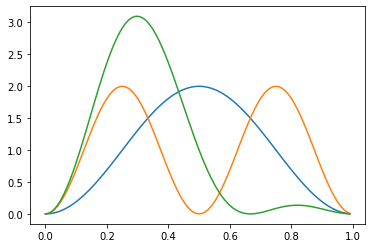

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1.0, 0.01) # Let L = 1 for this problem.

line1, = ax.plot(x, (psi1)**2)
line2, = ax.plot(x, (psi2)**2)
line3, = ax.plot(x, psi_star_psi)


def animate(i):
    t=i/20
    line1.set_ydata(psi1**2)
    line2.set_ydata(psi2**2)
    line3.set_ydata(0.5*(psi1)**2 + 0.5*(psi2)**2 + psi1*psi2*cos(t))
    return line1,line2,line3

anim = animation.FuncAnimation(fig, animate, interval=50,
                               blit=True, save_count=200)


In [ ]:
anim

Wow!  The particle moves back and forth in the well.  This is why we call these *nonstationary states*.

We can find the expectation value of the position,

$$
\overline{x} = \frac{1}{2}\int_0^L x\psi_1^2 dx + \frac{1}{2}\int_0^L x\psi_2^2 dx + \int_0^L x\psi_1\psi_2 \cos\left(\tfrac{\Delta E}{\hbar}t \right)
$$

integrated over the well.  We know the first two integrals from experience, $L/2$.  For the third integral, we pull the time part out of the integral and [consult Wolfram Alpha for the space part](https://www.wolframalpha.com/input?i2d=true&i=Integrate%5Bx*Divide%5B2%2CL%5D*sin%5C%2840%29Divide%5Bpi%2CL%5D+x%5C%2841%29sin%5C%2840%292+Divide%5Bpi%2CL%5D+x%5C%2841%29%2C%7Bx%2C0%2CL%7D%5D).  Putting it all together, the answer is

$$
\overline{x} = \frac{1}{2} \frac{L}{2} + \frac{1}{2}\frac{L}{2}  -0.180 \cos\left(\tfrac{\Delta E}{\hbar}t \right) = \frac{L}{2}  -0.180 L \cos\left(\tfrac{\Delta E}{\hbar}t \right)
$$

Let's add this expectation value of the position  to the animation as a black dot to see what it looks like.

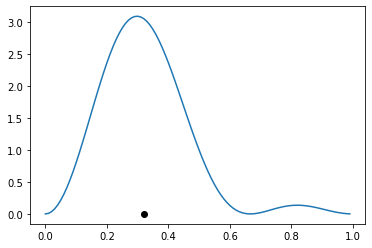

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1.0, 0.01) # Let L = 1 for this problem.

line1, = ax.plot(0.5 -0.18*np.cos(0),0,'ko')
line2, = ax.plot(x,psi_star_psi)


def animate(i):
    t=i/20
    line1.set_xdata(0.5 - 0.18*np.cos(t))
    line2.set_ydata(0.5*(psi1)**2 + 0.5*(psi2)**2 + psi1*psi2*cos(t))
    return line1,line2

anim = animation.FuncAnimation(fig, animate, interval=50,
                               blit=True, save_count=200)


In [ ]:
anim

Looks great and makes sense!  

What about the energy?

We can find the expectation value of the energy, but we have to use the energy operator, $i\hbar \tfrac{\partial}{\partial t}$ on $\Psi$ before multiplying by $\Psi^*$.


$$
\Psi^*E\Psi(x,t) = \left[\frac{1}{\sqrt{2}}\psi_1(x) e^{i\frac{E_1}{\hbar} t} + \frac{1}{\sqrt{2}}\psi_2(x)  e^{i\frac{E_2}{\hbar} t}\right] i\hbar \frac{\partial}{\partial t}\left[\frac{1}{\sqrt{2}}\psi_1(x) e^{-i\frac{E_1}{\hbar} t} + \frac{1}{\sqrt{2}}\psi_2(x)  e^{-i\frac{E_2}{\hbar} t}\right]
$$

Doing the time derivative,
$$
\Psi^*E\Psi(x,t) = \left[\frac{1}{\sqrt{2}}\psi_1(x) e^{i\frac{E_1}{\hbar} t} + \frac{1}{\sqrt{2}}\psi_2(x)  e^{i\frac{E_2}{\hbar} t}\right] \left[\frac{1}{\sqrt{2}}E_1\psi_1(x) e^{-i\frac{E_1}{\hbar} t} + \frac{1}{\sqrt{2}}E_2\psi_2(x)  e^{-i\frac{E_2}{\hbar} t}\right]
$$

Now we have four terms, and they don't simplify like the plain probability density does.
$$
\Psi^*E\Psi(x,t) = \frac{1}{2}E_1\psi_1^2 + \frac{1}{2}E_2\psi_2^2 + \frac{1}{2}E_1\psi_1\psi_2 e^{i\frac{E_2-E_1}{\hbar}t}
+ \frac{1}{2}E_2\psi_1\psi_2 e^{-i\frac{E_2-E_1}{\hbar}t}
$$

When we do the integrals, [maybe by consulting Wolfram Alpha again](https://www.wolframalpha.com/input?i2d=true&i=Integrate%5Bsin%5C%2840%29Divide%5B1+pi+x%2CL%5D%5C%2841%29sin%5C%2840%29Divide%5B2+pi+x%2CL%5D%5C%2841%29%2C%7Bx%2C0%2CL%7D%5D), we find that $\int_0^L \psi_1\psi_2 dx = 0$.  And, we know from normalization that  $\int_0^L \psi_1^2dx = 1$, so the answer is very simple:

$$
\overline{E} = \int_0^L \Psi^*E\Psi(x,t) = \frac{1}{2}E_1 + \frac{1}{2}E_2 = \frac{1}{2}(E_1+E_2)
$$

A-ha!  The expectation value for energy is just the average of the two energy states.

You should next show by calculating $\overline{E^2}$ that $\Delta E$ is not zero.  In other words, energy is not a well-definited value for the mixed state.
